Date: 04/03/2024

### PROJECT - Building a predictive model

In [1]:
from plotly.subplots import make_subplots

In [2]:
import chart_studio.plotly as py
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import scipy as sp

from sklearn.compose import ColumnTransformer, TransformedTargetRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import root_mean_squared_error
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer

In [3]:
# set seed for random number generator
rng = np.random.RandomState(42)

In [4]:
pd.set_option('display.max_columns', None) # display all columns
pd.set_option('display.max_rows', None) # display all rows

---

**Question 3 - Is it possible to predict the price of a listing?** 

To answer this question, we will build a supervised machine learning model whose objective is to predict the price of a listing based on its features. The data in `listings` will be used as it gathers features about each of the listings in Seatlle (as of 4 January 2016).

In [5]:
# load the dataset
listings = pd.read_csv('./data/listings.csv')

#### Step 1 - Quick Look at the data structure

In [6]:
# retrieve top 5 rows
listings.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,NaN,NaN,https://a1.muscache.com/ac/pictures/67560560/c...,NaN,956883,https://www.airbnb.com/users/show/956883,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,https://a0.muscache.com/ac/users/956883/profil...,https://a0.muscache.com/ac/users/956883/profil...,Queen Anne,3.0,3.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.636289,-122.371025,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",NaN,$85.00,NaN,NaN,NaN,NaN,2,$5.00,1,365,4 weeks ago,t,14,41,71,346,2016-01-04,207,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/im/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,5177328,https://www.airbnb.com/users/show/5177328,Andrea,2013-02-21,"Seattle, Washington, United States",Living east coast/left coast/overseas. Time i...,within an hour,98%,100%,t,https://a0.muscache.com/ac/users/5177328/profi...,https://a0.muscache.com/ac/users/5177328/profi...,Queen Anne,6.0,6.0,"['email', 'phone', 'facebook', 'linkedin', 're...",t,t,"7th Avenue West, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.639123,-122.365666,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",NaN,$150.00,"$1,000.00","$3,000.00",$100.00,$40.00,1,$0.00,2,90,today,t,13,13,16,291,2016-01-04,43,2013-08-19,2015-12-29,96.0,10.0,10.0,10.0,10.0,10.0,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48
2,3308979,https://www.airbnb.com/rooms/3308979,20160104002432,2016-01-04,New Modern House-Amazi

In [7]:
# retrieve shape of dataset
listings.shape

(3818, 92)

In [8]:
# retrieve each attribute's type and amount of non-null values
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3818 entries, 0 to 3817
Data columns (total 92 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   id                                3818 non-null   int64  
 1   listing_url                       3818 non-null   object 
 2   scrape_id                         3818 non-null   int64  
 3   last_scraped                      3818 non-null   object 
 4   name                              3818 non-null   object 
 5   summary                           3641 non-null   object 
 6   space                             3249 non-null   object 
 7   description                       3818 non-null   object 
 8   experiences_offered               3818 non-null   object 
 9   neighborhood_overview             2786 non-null   object 
 10  notes                             2212 non-null   object 
 11  transit                           2884 non-null   object 
 12  thumbn

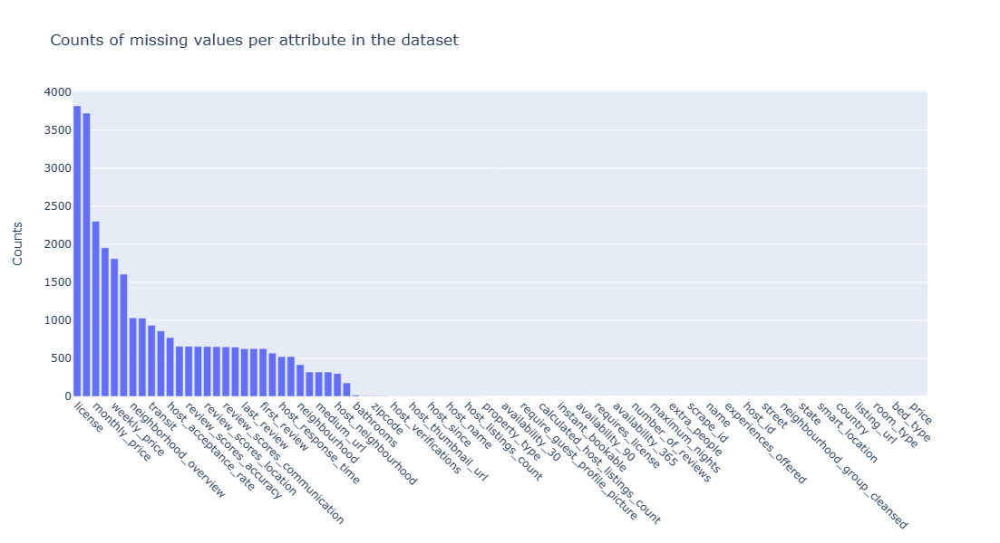

In [9]:
# plot the amount of missing values per attribute
valmissing_counts = listings.isna().sum().sort_values(ascending=False)
valmissing_perc = 100 * valmissing_counts/listings.shape[0]
fig = go.Figure()
fig.add_trace({'x': valmissing_counts.index,
               'y': valmissing_counts,
               'customdata': valmissing_perc, # percentage of missing values per attribute
               'hovertemplate': '<b>Attribute</b>: %{x}<br><b>Missing values</b>: %{y} (%{customdata:.2f}%)<extra></extra>',
               'type': 'bar'})
fig.update_layout({'title': 'Counts of missing values per attribute in the dataset',
                   'width': 1000,
                   'height': 600})
fig.update_yaxes({'title': 'Counts'})
fig.update_xaxes({'tickangle': 45})
fig.show()

**Note**: Each rows corresponds to one listing. Each listing also has 92 attributes. 
There are only 3818 instances in our dataset, so this would be considered as a fairly small one by Machine Learning standards.

We also notice the presence of missing values for many attributes. In particular, we can see that the `license` attribute only has missing values, meaning that all instances are missing this feature. The *square_feet* attribute also has more than 97% missing values. We will have to take care of this later.

The attributes are either numerical or of dtype `object`. We can see that for some attributes, their dtype does not match with the nature of the information they hold. For example, the `price` is expected to be a numerical attribute - and yet, it is of dtype `object` in the dataset. This will need to be addressed.

Let's clean our dataset so that each attribute is of the appropriate dtype.

In [10]:
def cleanse_dtypes(df):
    """Transform the attributes in `df` so that they are of the appropriate type.

    Args:
        df (pd.DataFrame): The object whose attributes need to be transformed to the appropriate dtypes.

    Returns:
        pd.DataFrame: The transformed object.

    """
    for col in ['last_scraped', 'host_since', 'calendar_last_scraped', 'first_review', 'last_review']:
        df[col] = pd.to_datetime(df[col])
    for col in ['id', 'scrape_id', 'host_id']:
        df[col] = df[col].astype('str')
    for col in ['host_response_rate', 'host_acceptance_rate']:
        df[col] = df[col].str.replace('%', '').astype('float')
    for col in ['price', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee', 'extra_people']:
        df[col] = df[col].str.replace('$', '').str.replace(',', '').astype(float)
    return df

In [11]:
# check function works as expected
df = cleanse_dtypes(listings.copy())
df.head(2)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,NaN,NaN,https://a1.muscache.com/ac/pictures/67560560/c...,NaN,956883,https://www.airbnb.com/users/show/956883,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96.0,100.0,f,https://a0.muscache.com/ac/users/956883/profil...,https://a0.muscache.com/ac/users/956883/profil...,Queen Anne,3.0,3.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.636289,-122.371025,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",NaN,85.0,NaN,NaN,NaN,NaN,2,5.0,1,365,4 weeks ago,t,14,41,71,346,2016-01-04,207,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07
1,953595,https://www.airbnb.com/rooms/953595,20160104002432,2016-01-04,Bright & Airy Queen Anne Apartment,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,none,"Queen Anne is a wonderful, truly functional vi...",What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/im/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/ac/pictures/14409893/f...,5177328,https://www.airbnb.com/users/show/5177328,Andrea,2013-02-21,"Seattle, Washington, United States",Living east coast/left coast/overseas. Time i...,within an hour,98.0,100.0,t,https://a0.muscache.com/ac/users/5177328/profi...,https://a0.muscache.com/ac/users/5177328/profi...,Queen Anne,6.0,6.0,"['email', 'phone', 'facebook', 'linkedin', 're...",t,t,"7th Avenue West, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.639123,-122.365666,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",NaN,150.0,1000.0,3000.0,100.0,40.0,1,0.0,2,90,today,t,13,13,16,291,2016-01-04,43,2013-08-19,2015-12-29,96.0,10.0,10.0,10.0,10.0,10.0,10.0,f,NaN,WASHINGTON,f,strict,t,t,6,1.48


Let's look more into the different fields.

In [12]:
df.describe(include='all')

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
count,3818,3818,3818,3818,3818,3641,3249,3818,3818,2786,2212,2884,3498,3498,3818,3498,3818,3818,3816,3816,3810,2959,3295,3295.000000,3045.000000,3816,3816,3816,3518,3816.000000,3816.000000,3816,3816,3816,3818,3402,3818,3818,3818,3818,3811,3818,3818,3818,3818,3818.000000,3818.000000,3818,3817,3818,3818.000000,3802.000000,3812.000000,3817.000000,3818,3818,97.000000,3818.000000,2009.000000,1517.000000,1866.000000,2788.000000,3818.000000,3818.000000,3818.000000,3818.000000,3818,3818,3818.000000,3818.000000,3818.000000,3818.000000,3818,3818.000000,3191,3191,3171.000000,3160.000000,3165.000000,3160.000000,3167.000000,3163.000000,3162.000000,3818,0.0,3818,3818,3818,3818,3818,3818.000000,3191.000000
unique,3818,3818,1,NaN,3792,3478,3119,3742,1,2506,1999,2574,3498,3498,3818,3498,2751,2751,1466,NaN,120,2011,4,NaN,NaN,2,2743,2743,102,NaN,NaN,115,2,2,1442,81,87,17,7,2,28,1,7,1,1,NaN,NaN,2,16,3,NaN,NaN,NaN,NaN,5,3284,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,1,2,3,2,2,NaN,NaN
top,241032,https://www.airbnb.com/rooms/241032,20160104002432,NaN,Capitol Hill Apartment,This is a modern fully-furnished studio apartm...,"*Note: This fall, there will be major renovati...",Our space is a mix of a hostel and a home. We ...,none,Wallingford is a mostly-residential neighborho...,All of our rentals are fully licensed and regu...,Convenient public transportation. The location...,https://a0.muscache.com/ac/pictures/14409893/f...,https://a0.muscache.com/im/pictures/14409893/f...,https://a1.muscache.com/ac/pictures/67560560/c...,https://a0.muscache.com/ac/pictures/14409893/f...,8534462,https://www.airbnb.com/users/show/8534462,Andrew,NaN,"Seattle, Washington, United States",It would be my pleasure to share and explore t...,within an hour,NaN,NaN,f,https://a2.muscache.com/ac/pictures/a4d7d053-c...,https://a2.muscache.com/ac/pictures/a4d7d053-c...,Capitol Hill,NaN,NaN,"['email', 'phone', 'facebook', 'reviews', 'kba']",t,t,"1st Avenue, Seattle, WA 98101, United States",Capitol Hill,Broadway,Other neighborhoods,Seattle,WA,98122,Seattle,"Seattle, WA",US,United States,NaN,NaN,t,House,Entire home/apt,NaN,NaN,NaN,NaN,Real Bed,{},NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,today,t,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,f,NaN,WASHINGTON,f,strict,f,f,NaN,NaN
freq,1,1,3818,NaN,3,15,14,10,3818,17,39,32,1,1,1,1,46,46,56,NaN,3259,46,1692,NaN,NaN,3038,46,46,405,NaN,NaN,595,3809,2997,30,351,397,794,3810,3817,420,3818,3810,3818,3818,NaN,NaN,3412,1733,2541,NaN,NaN,NaN,NaN,3657,45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,706,3818,Na

**Note**: Some hosts seems to have multiple listings in our data. For example, *host_id* 8534462 is associated with 46 different listings. 

Although the `experienced_offered` attribute does not have missing values, it has a unique one which is *None* - so none of the listing offer experiences to their Airbnb guest. Similarly, the `last_scraped`, `market`, `country_code`, `country`, `has_availability`, `calendar_last_scraped`, `require_license` and `jurisdiction_names` attributes all consist of a single value repeated across the instances. This will need to be taken care of later. 

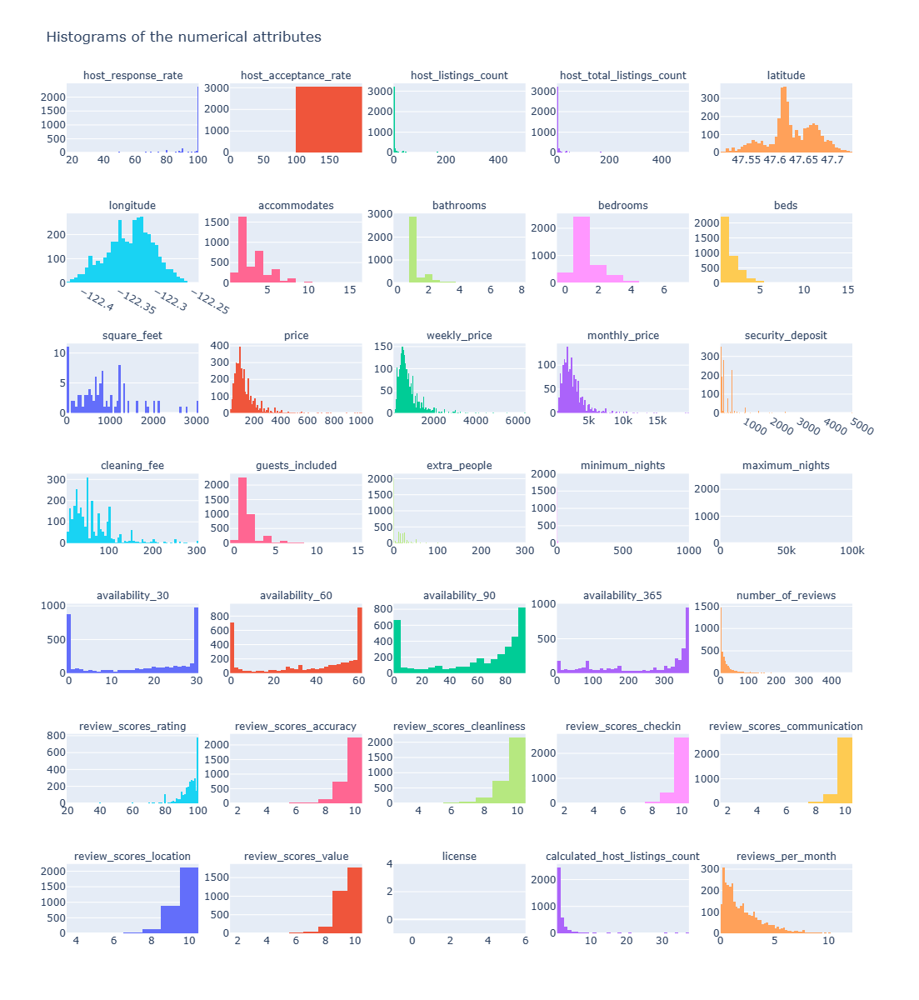

In [13]:
# plot histograms for numerical attributes
df_numerical = df.select_dtypes(include=['int', 'float'])
fig = make_subplots(rows=7, cols=5, subplot_titles=df_numerical.columns)
fig.add_traces([{'x': df_numerical.iloc[:, i].to_numpy(),
                 'showlegend': False,
                 'type': 'histogram'} for i in np.arange(35)], 
               rows=list(np.repeat([1, 2, 3, 4, 5, 6, 7], 5)), 
               cols=[1, 2, 3, 4, 5]*7)
fig.update_layout({'title': 'Histograms of the numerical attributes', 'width': 1200, 'height': 1200})
fig.update_annotations({'font': {'size': 12}})
fig.show()

**Note**: 
The majority of the numerical attributes have skewed distributions. 

For example, our target attribute *price* has a left skewed distribution. This will have to be taken care of later prior to building a predictive model. 

These attributes also have very different scales.

We also notice that some attributes have similar distributions. For example, the distribution for the *review_scores_accuracy* attribute is similar to the distribution for the *review_scores_cleanliness* attribute. Similarly, the distribution for the *review_scores_checkin* attribute is similar to the distribution for the *review_scores_communication* attribute. 

#### Step 2 - Create a test set

As an Airbnb user myself, I have often noticed that the nightly price for an entire accomodation (house/appartment) tend to be higher than the ones for a private or shared room. I therefore think that the *room_type* attribute is an important attribute to predict the nightly price of a listing. 

In this section, we will see if the data seems to confirm our intuition. If that it the case (and given the fact that the *room_type* attribute does not have any missing values), we will then create a test set using stratified sampling rather than random sampling - this will help us try to ensure that the test set is representative of the whole population. 

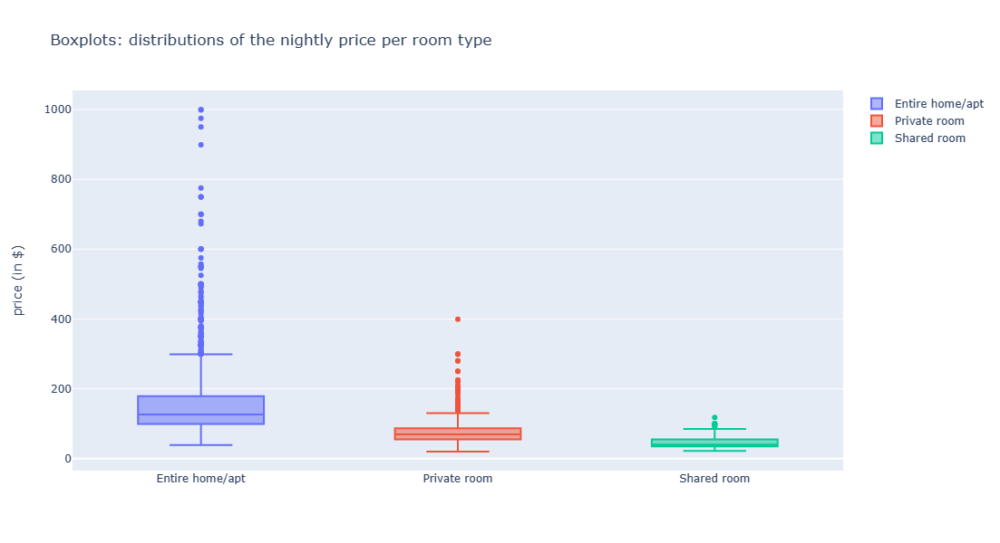

In [14]:
# plot boxplots: room type versus price
grps = df.loc[:, ['room_type', 'price']].groupby(by='room_type')
fig = go.Figure()
fig.add_traces([{'y': g['price'],
                 'name': name,
                 'type': 'box'} for name, g in grps])
fig.update_layout({'title': 'Boxplots: distributions of the nightly price per room type',
                   'width': 600, 'height': 600})
fig.update_yaxes({'title': 'price (in $)'})
fig.show()

**Note**: This boxplot confirms our intuition. Indeed, these three distributions show that the nightly prices for entire homes/apts tend to be higher than those for private rooms which themselves tend to be higher than those for shared rooms.

Prior to applying stratified sampling, let's see if each of our stratum of choice are large enough.

In [15]:
# check the room_type category proportions in the full dataset
grps.count()

,price
room_type,
Entire home/apt,2541
Private room,1160
Shared room,117


**Note**: In our opinion, each stratum seems large enough to apply stratified sampling.

In [16]:
# apply stratified sampling
ss = StratifiedShuffleSplit(n_splits=1, test_size=0.20, random_state=rng)
for train_index, test_index in ss.split(df, df['room_type']):
    train_set = df.loc[train_index]
    test_set = df.loc[test_index]

In [17]:
# check the room type category proportions
proportions = grps.count().rename(columns={'price': 'Overall'}) / df.shape[0]
proportions['Stratified_test'] = test_set['room_type'].value_counts() / test_set.shape[0]
proportions

,Overall,Stratified_test
room_type,,
Entire home/apt,0.665532,0.666230
Private room,0.303824,0.303665
Shared room,0.030644,0.030105


**Note**: The results are as expected. Our test set is representative of the whole population.

#### Step 3 - Explore the data

In this section, we will explore the training set.

In [18]:
# create copy of the training set
df_train = train_set.copy()

- **Explore the numerical attributes**

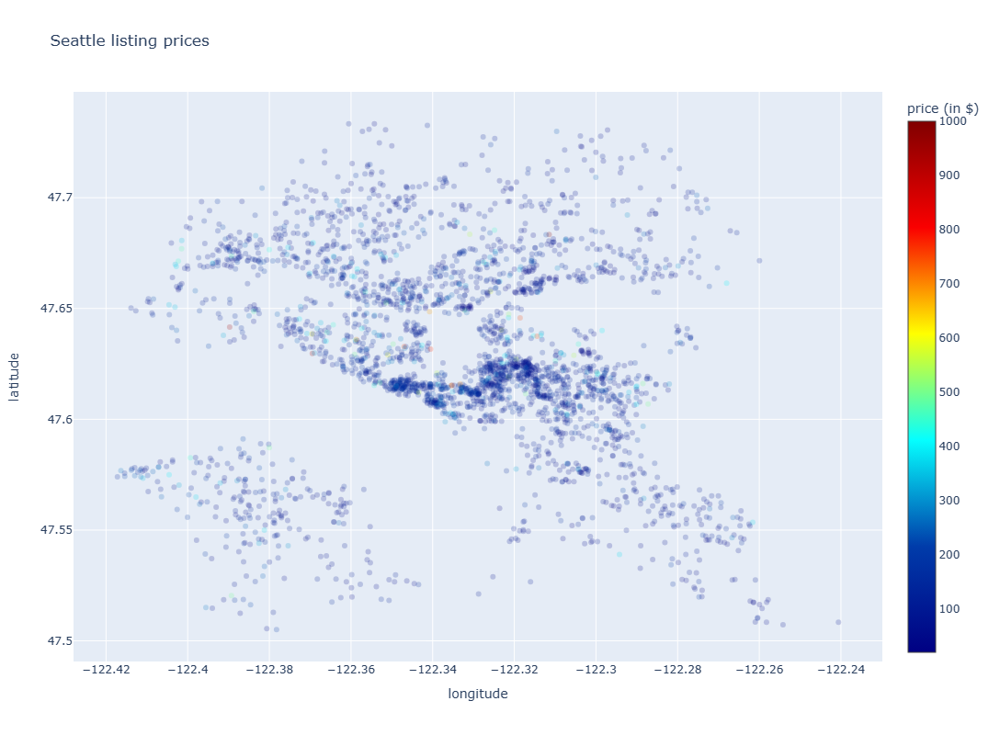

In [19]:
# visualise graphical data
fig = go.Figure()
fig.add_trace({'x': df_train['longitude'],
               'y': df_train['latitude'],
               'mode': 'markers',
               'marker': {'opacity': 0.2, 'color': df_train['price'], 'colorscale': 'jet', 'showscale': True, 'colorbar': {'title': 'price (in $)'}},
               'type': 'scatter'})
fig.update_layout({'title': 'Seattle listing prices', 'width': 600, 'height': 800})
fig.update_xaxes({'title': 'longitude'})
fig.update_yaxes({'title': 'latitude'})
fig.show()

**Note**: The plot reveals the shape of Seattle. It was plotted in order to determing wether there's a strong relationship between the location of a listing (high-density area, specific neighbourhood, close to the coast..) and its price. Unfortunately, we cannot reach such conclusion when looking at this plot - there doesn't seem to be a strong relationship between a listing's location and its price.

Let's look at how much the numerical attributes correlate to the *price* attribute.

In [20]:
corr_num = df_train.corr(numeric_only=True)['price'].sort_values(ascending=False)
corr_num

price                             1.000000
weekly_price                      0.936094
monthly_price                     0.873196
cleaning_fee                      0.654299
accommodates                      0.643089
bedrooms                          0.631109
beds                              0.582423
bathrooms                         0.522593
square_feet                       0.515569
guests_included                   0.389096
security_deposit                  0.365880
extra_people                      0.128141
host_total_listings_count         0.097422
host_listings_count               0.097422
review_scores_location            0.058332
review_scores_cleanliness         0.048155
review_scores_rating              0.044816
minimum_nights                    0.016360
review_scores_accuracy            0.014576
host_acceptance_rate              0.006607
review_scores_communication       0.000728
maximum_nights                   -0.003174
latitude                         -0.005189
review_scor

**Note**: We see that the *weekly_price* and *monthly_price* attributes share strong correlation coefficients with the *price* attribute. This comes as no surprise since hosts most likely determine the weekly and monthly price of their listing based on the nightly rate. Other cost-related attributes also seem to correlate with *price* attribute (e.g. *cleaning_fee* and *security_deposit*).

However, we think these cost-related attributes should not be selected as features when building the predictive model. Indeed, it should be possible to estimate the nightly price of a listing knowing its weekly and/or monthly price - the need for a predictive model would not necessarily be justified.
When it comes to the *cleaning_fee* and *security_deposit*, selecting them as features would go against our initial question which implies not knowing any cost-related information about a listing to start with.

A few promising attributes that seam most correlated to the *price* attribute do stand out:

    - accommodates
    - bedrooms
    - beds
    - bathrooms
    - square_feet
    - guests_included

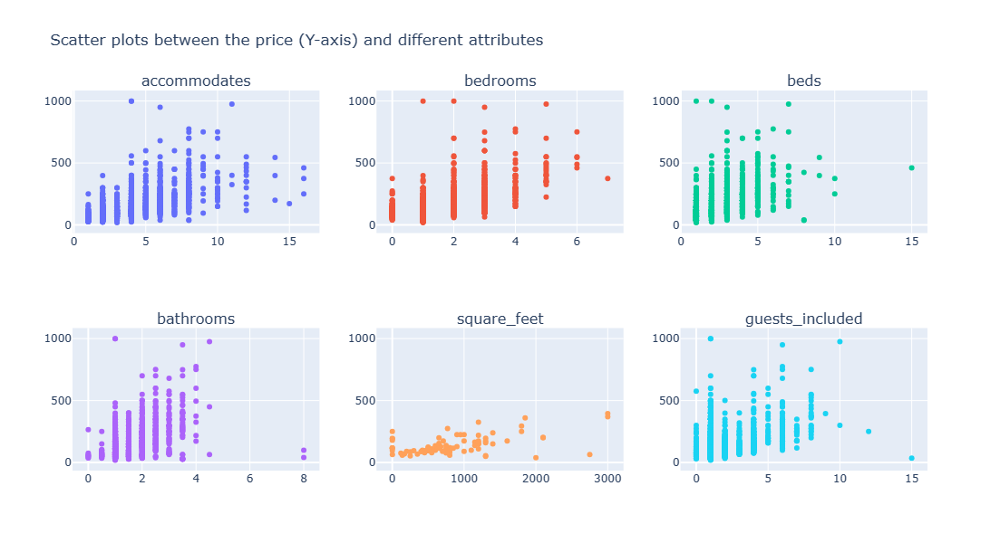

In [21]:
# plot corresponding scatter plots
attributes = ['accommodates', 'bedrooms', 'beds', 'bathrooms', 'square_feet', 'guests_included']
fig = make_subplots(rows=2, cols=3, subplot_titles=attributes)
fig.add_traces([{'x': df_train[attr],
                 'y': df_train['price'],
                 'showlegend': False,
                 'mode': 'markers',
                 'type': 'scatter'} for attr in attributes],
              rows=list(np.repeat([1, 2], 3)),
              cols=[1, 2, 3]*2)
fig.update_layout({'title': 'Scatter plots between the price (Y-axis) and different attributes' , 'width': 800, 'height': 600})
fig.show()

**Note**: The plots show that the correlations are indeed strong. Indeed, the price of a listing generally increases when the value of each of these attributes increases. However, we do remember that the `square_feet` attribute has more than 97% missing values so it is best to remove it from the list of promising numerical attributes.  

- **Explore the text and categorical attributes**

In [22]:
# quick look at the categorical variables
df_train.select_dtypes(exclude=['int', 'float']).head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,is_location_exact,property_type,room_type,bed_type,amenities,calendar_updated,has_availability,calendar_last_scraped,first_review,last_review,requires_license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
1182,3876097,https://www.airbnb.com/rooms/3876097,20160104002432,2016-01-04,Shared space adjacent to Park,This is a couch in the living room. There is ...,This space is across the street from a park. ...,This is a couch in the living room. There is ...,none,NaN,NaN,NaN,https://a0.muscache.com/ac/pictures/50217537/0...,https://a0.muscache.com/im/pictures/50217537/0...,https://a0.muscache.com/ac/pictures/50217537/0...,https://a0.muscache.com/ac/pictures/50217537/0...,10043337,https://www.airbnb.com/users/show/10043337,Tessa,2013-11-16,"Seattle, Washington, United States","I love people. I enjoy the gym, yoga, running...",within an hour,f,https://a1.muscache.com/ac/users/10043337/prof...,https://a1.muscache.com/ac/users/10043337/prof...,Magnolia,"['email', 'phone', 'facebook', 'reviews']",t,f,"West Government Way, Seattle, WA 98199, United...",NaN,Lawton Park,Magnolia,Seattle,WA,98199,Seattle,"Seattle, WA",US,United States,t,Bed & Breakfast,Shared room,Couch,"{Internet,""Wireless Internet"",Kitchen,Breakfas...",6 days ago,t,2016-01-04,2014-08-20,2015-11-23,f,WASHINGTON,f,flexible,f,f
1320,257140,https://www.airbnb.com/rooms/257140,20160104002432,2016-01-04,1 Bed Territorial View-Book now!,Seattle Oasis Vacation Rentals is proud to pre...,"We have a walkscore of 98/100, hard to find a ...",Seattle Oasis Vacation Rentals is proud to pre...,none,NaN,NaN,NaN,https://a2.muscache.com/ac/pictures/da6a0f7f-2...,https://a2.muscache.com/im/pictures/da6a0f7f-2...,https://a2.muscache.com/ac/pictures/da6a0f7f-2...,https://a2.muscache.com/ac/pictures/da6a0f7f-2...,74305,https://www.airbnb.com/users/show/74305,Darik,2010-01-27,"Kent, Washington, United States","My wife, Sally and I are excited for you to st...",within a few hours,f,https://a0.muscache.com/ac/users/74305/profile...,https://a0.muscache.com/ac/users/74305/profile...,Belltown,"['email', 'phone', 'facebook', 'linkedin', 're...",t,t,"3rd Ave, Seattle, WA 98121, United States",Belltown,Belltown,Downtown,Seattle,WA,98121,Seattle,"Seattle, WA",US,United States,t,Apartment,Entire home/apt,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""W...",today,t,2016-01-04,2011-11-06,2015-12-03,f,WASHINGTON,t,strict,t,t
3102,4701146,https://www.airbnb.com/rooms/4701146,20160104002432,2016-01-04,"One Bedroom Apartment, Two Beds","Mother in law apt. with separate entrance, off...",This listing is for a well used one bedroom mo...,"Mother in law apt. with separate entrance, off...",none,Residential suburban neighborhood within block...,This space is clean with new sheets and towels...,King County Metro is the bus system has severa...,https://a0.muscache.com/ac/pictures/87581488/d...,https://a0.muscache.com/im/pictures/87581488/d...,https://a0.muscache.com/ac/pictures/87581488/d...,https://a0.muscache.com/ac/pictures/87581488/d...,24301524,https://www.airbnb.com/users/show/24301524,Barbie,2014-11-29,"Seattle, Washington, United States",I'm a chocolate blogger and craft chocolate en...,NaN,f,https://a0.muscache.com/ac/users/24301524/prof...,https://a0.muscache.com/ac/users/24301524/prof...,Olympic Hills,"['email', 'phone', 'facebook', 'linkedin', 're...",t,t,"20th Avenue Northeast, Seattle, WA 98125,

**Note**: Some of the attributes are arbitrary text. The type of model we're trying to build don't accept such attributes, so they will have to be removed from our training data.
Other attributes are also irrelevant - this is the case for all the URL links and ID information (numbers or names).
We also notice that some attributes are redundant and/or provide information we are already aware of. For example, *city* and *market* provide the exact same information (i.e. the listings are located in Seattle) and this is obviously something we were already aware of (i.e. all the data we have is related to listings which are indeed located in Seattle, Washington US).
Other attributes are series of dates - these will have to be transformed into numerical attributes. 
Finally, we notice that the values in the *host_verifications* and *amenities* attributes are in fact list of items which need to have their own attribute. 

Let's now take care of what we took note of.

- Decoupling the *host_verifications* and *amenities* attributes 

In [23]:
class Decoupler:
    """Handling of the decoupling of the `host_verifications` and `amenities` attributes.

    Args:
        x (pd.Series): Series to be decoupled.

    """
    def __init__(self):
        """Initialise the instance of the class."""
        self._extracted_data = None
        self._uniques = None
        self._xdecoupled = None
        self._processed = None
        
    # @property
    # def xdecoupled(self):
    #     """pd.DataFrame: The decoupled data after processing `x`."""
    #     return self._xdecoupled if self._processed else None

    def decouple(self, x: pd.Series) -> pd.DataFrame:
        """Main program entry point and callable.

        Args:
            x (pd.Series): Object to decouple.
        
        :Processing:
            - Extract data from `x`.
            - Find uniques values in the extracted data.
            - Apply hashmap to the extracted data.
            
        """
        success = self._extract_data(x=x)
        if success:
            success = self._find_uniques()
        if success:
            self._xdecoupled = pd.DataFrame(self._extracted_data.apply(self._hashmap, axis=1).to_list(), index=x.index, columns=self._uniques)
            # self._processed = True
        return self._xdecoupled

    def _extract_data(self, x: pd.Series) -> bool:
        """Extract data from `x`.

        Args:
            x (pd.Series): Object to extract data from.

        Returns:
            bool: True if successful, False otherwise.
            
        """
        success = False
        self._extracted_data = x.str.split(pat=',', expand=True)
        self._extracted_data = self._extracted_data.apply(lambda x: x.str.strip(' {}"[]\''))
        success = True
        return success
            
    def _find_uniques(self) -> bool:
        """Find unique values in the extracted data.

        Returns:
            bool: True if successful, False otherwise.

        """
        success = False
        self._uniques = sorted(filter(lambda x: x not in ('', None, np.nan), set(self._extracted_data.values.ravel())))
        success = True
        return success

    def _hashmap(self, s: pd.Series) -> bool:
        """Create hashtable of values from pandas Series `s`.

        Args:
            s (pd.Series): Series to apply the hashmap on.

        Returns:
            h (list): A list of hashtable values to be added to a new DataFrame.

        """
        h = [0] * len(self._uniques)
        d = dict(zip(self._uniques, np.arange(len(self._uniques))))
        for val in filter(lambda x: x not in ('', None, np.nan), s):
            h[d.get(val)] = 1
        return h

In [24]:
# check function works as expected
dcplr = Decoupler()
dcplr.decouple(df_train['host_verifications']).head()

,amex,email,facebook,google,jumio,kba,linkedin,manual_offline,manual_online,phone,photographer,reviews,sent_id,weibo
1182,0,1,1,0,0,0,0,0,0,1,0,1,0,0
1320,0,1,1,0,0,1,1,0,0,1,0,1,0,0
3102,0,1,1,0,1,0,1,0,0,1,0,1,0,0
2651,0,1,1,1,0,1,1,0,0,1,0,1,0,0
1207,0,0,0,0,0,1,1,0,0,1,0,1,0,0


In [25]:
# check transformer works as expected
dcplr.decouple(df_train['amenities']).head()

,24-Hour Check-in,Air Conditioning,Breakfast,Buzzer/Wireless Intercom,Cable TV,Carbon Monoxide Detector,Cat(s),Dog(s),Doorman,Dryer,Elevator in Building,Essentials,Family/Kid Friendly,Fire Extinguisher,First Aid Kit,Free Parking on Premises,Gym,Hair Dryer,Hangers,Heating,Hot Tub,Indoor Fireplace,Internet,Iron,Kitchen,Laptop Friendly Workspace,Lock on Bedroom Door,Other pet(s),Pets Allowed,Pets live on this property,Pool,Safety Card,Shampoo,Smoke Detector,Smoking Allowed,Suitable for Events,TV,Washer,Washer / Dryer,Wheelchair Accessible,Wireless Internet
1182,0,0,1,0,0,1,0,0,0,1,1,1,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1
1320,0,0,0,1,1,1,0,0,0,1,1,1,1,1,0,1,1,1,1,1,0,0,1,1,1,0,0,0,0,0,0,1,1,1,0,0,1,1,0,1,1
3102,0,0,0,0,0,1,1,0,0,1,0,1,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,1,0,0,0
2651,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1
1207,1,1,0,0,1,1,0,0,1,1,1,1,0,0,0,0,1,1,1,1,0,0,1,1,1,1,0,0,0,0,0,0,1,1,0,0,1,1,0,1,1


- Transforming dates into numerical attributes: each date will be transformed into a number of days since 4 Jan 2016, the date at which the data was scraped

In [26]:
def to_days(df: pd.DataFrame):
    """Transform a DataFrame with columns of type datetime into numerical columns.

    Args:
        df: DataFrame to be transformed.
        
    Returns:
        pd.DataFrame: Tranformed dataFrame.

    """
    df_transformed = df.apply(lambda x: (pd.Timestamp(2016, 1, 4) - x).dt.days)
    return df_transformed

In [27]:
# check function works as expected
to_days(df_train.loc[:, ['last_scraped', 'host_since', 'calendar_last_scraped', 'first_review', 'last_review']])

,last_scraped,host_since,calendar_last_scraped,first_review,last_review
1182,0,779.0,0,502.0,42.0
1320,0,2168.0,0,1520.0,32.0
3102,0,401.0,0,386.0,129.0
2651,0,1752.0,0,1102.0,106.0
1207,0,301.0,0,200.0,1.0
3231,0,616.0,0,598.0,71.0
1452,0,543.0,0,NaN,NaN
1045,0,2205.0,0,134.0,134.0
225,0,1184.0,0,4.0,4.0
180,0,1056.0,0,582.0,158.0


- Discarding irrelevant and/or redundant attributes

In [28]:
# retrieve categorical attributes
todiscard = ['id',
             'listing_url',
             'scrape_id',
             'last_scraped', # transformed into a numerical attribute
             'name',
             'summary',
             'space', 
             'description',
             'neighborhood_overview',
             'notes',
             'transit',
             'thumbnail_url',
             'medium_url',
             'picture_url',
             'xl_picture_url',
             'host_id',
             'host_url',
             'host_name',
             'host_since', # transformed into a numerical attribute
             'host_location',
             'host_about',
             'host_thumbnail_url',
             'host_picture_url',
             'host_neighbourhood',
             'host_verifications', # decoupled into numerical attributes
             'street',
             'neighbourhood', # because `neighbourhood_cleansed` is also available
             'city',
             'state',
             'market',
             'smart_location',
             'country_code',
             'country',
             'amenities', # decoupled into numerical attributes
             'calendar_last_scraped', # transformed into a numerical attribute
             'first_review', # transformed into a numerical attribute
             'last_review', # transformed into a numerical attribute
             'jurisdiction_names'
            ]
cat_attrs = df_train.select_dtypes(exclude=['int', 'float']).columns.drop(todiscard)
cat_attrs

Index(['experiences_offered', 'host_response_time', 'host_is_superhost',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'zipcode',
       'is_location_exact', 'property_type', 'room_type', 'bed_type',
       'calendar_updated', 'has_availability', 'requires_license',
       'instant_bookable', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification'],
      dtype='object')

Now that we've taken care of some of the attributes, let's see how much they correlate with the *price* attribute.

In [29]:
# correlations between the now transformed attributes and `price` attribute
corr_num = pd.concat([df_train['price'], 
                      dcplr.decouple(df_train['host_verifications']),
                      dcplr.decouple(df_train['amenities']),
                      to_days(df_train.loc[:, ['last_scraped', 'host_since', 'calendar_last_scraped', 'first_review', 'last_review']])], 
                     axis=1).corr()['price'].sort_values(ascending=False)
corr_num

price                         1.000000
Family/Kid Friendly           0.262893
Cable TV                      0.243881
TV                            0.198821
Indoor Fireplace              0.155885
Air Conditioning              0.126993
Dryer                         0.126807
Kitchen                       0.125073
Doorman                       0.124663
Washer                        0.120535
last_review                   0.114909
Hot Tub                       0.110923
Gym                           0.104211
Suitable for Events           0.088437
Pool                          0.084988
Free Parking on Premises      0.083506
Pets Allowed                  0.082718
Elevator in Building          0.079812
Internet                      0.074319
host_since                    0.060230
linkedin                      0.054533
Fire Extinguisher             0.050085
Carbon Monoxide Detector      0.048589
Wheelchair Accessible         0.048211
Safety Card                   0.047044
manual_online            

**Note**: None of the attributes strongly correlates with the *price* attribute they will therefore not be selected as features for the predictive model.

We will now focus on our remaing attributes by plotting their distributions. 

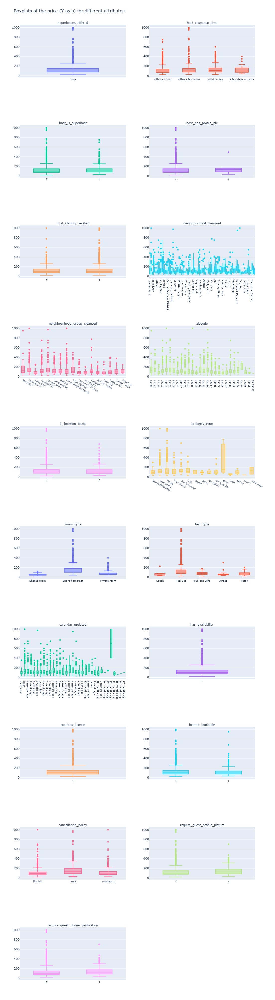

In [30]:
# plot corresponding boxplots
fig = make_subplots(rows=10, cols=2, subplot_titles=cat_attrs)
fig.add_traces([{'x': df_train[attr],
                 'y': df_train['price'],
                 'showlegend': False,
                 # 'mode': 'markers',
                 'type': 'box'} for attr in cat_attrs],
              rows=list(np.repeat([1, 2, 3, 4, 5, 6, 7, 8 , 9], 2)) + [10],
              cols=[1, 2]*9 + [1])
fig.update_layout({'title': 'Boxplots of the price (Y-axis) for different attributes' , 'width': 1000, 'height': 4000})
fig.update_annotations({'font': {'size': 12}})
fig.update_xaxes({'tickfont': {'size': 10}})
fig.show()

**Note**: Some of the attributes seem promising.

For example, the plot for the *neighbourhood_cleansed* attribute shows that prices can substantially vary from one neighbourhood to another - we will zoom on the same plot later to confirm our initial observation.
Similarly, the plots for location-related attributes *neighbourhood_group_cleansed* and *zipcode* show strong differences in median price between neighbouhood groups and zipcodes.

Other promising attributes include:

- host_response_time
- host_has_profile_pic
- property_type
- room_type (as already discussed previously)
- bed_type
- calendar_updated
- cancellation_policy
- require_guest_profile_picture
- require_guest_phone_verification

We also notice that it might be possible to reduce the number of categories for some of the attributes we highlighted. 

Let's zoom in on the `neighbourhood_cleansed`, `neighbourhood_group_cleansed` and `zipcode` attributes to confirm our initial observation.

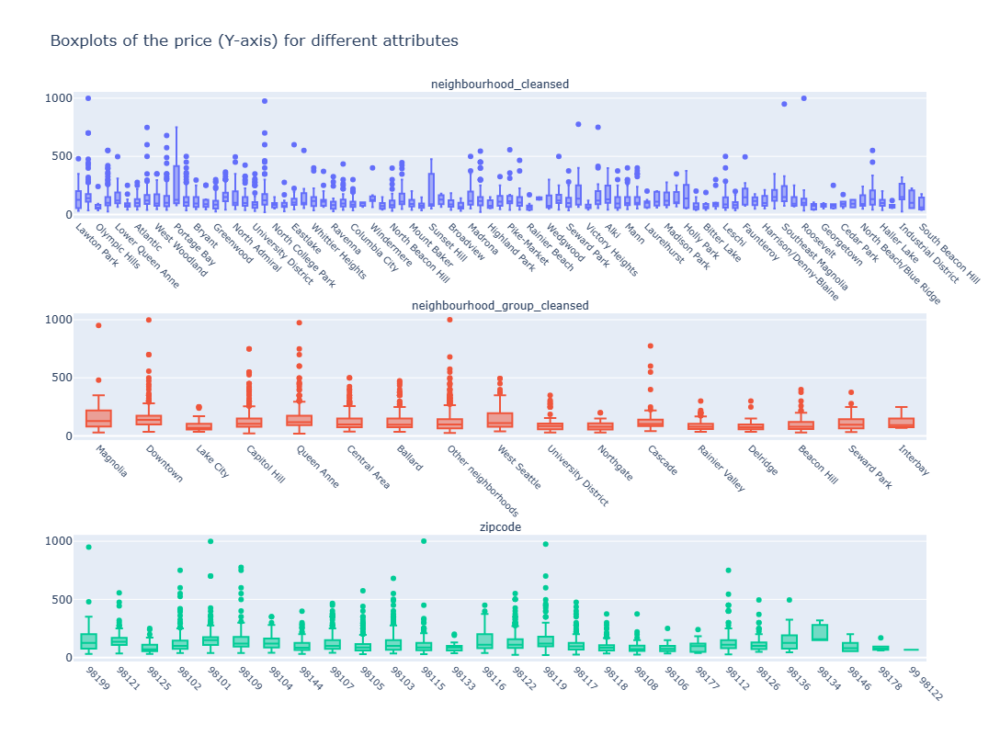

In [31]:
# plot boxplots for promising categorical attributes
attributes = ['neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'zipcode']
fig = make_subplots(rows=3, cols=1, subplot_titles=attributes)
fig.add_traces([{'x': df_train[attr],
                 'y': df_train['price'],
                 'showlegend': False,
                 'type': 'box'} for attr in attributes],
              rows=[1, 2, 3],
              cols=[1, 1, 1])
fig.update_layout({'title': 'Boxplots of the price (Y-axis) for different attributes', 'height': 800})
fig.update_annotations({'font': {'size': 12}})
fig.update_xaxes({'tickfont': {'size': 10}, 'tickangle': 45})
fig.show()

**Note**: The plots do show differences in price medians and distributions between the categories in each of these three attributes. 

We will now try and reduce the number of categories for some of the promising attributes we mentioned ealier.

In [32]:
class Reducer:
    """Handling of the reducing of categories for the following attributes:
        - property_type
        - bed_type
        - calendar_updated
    Args:
        df (pd.DataFrame): DataFrame whose columns' categories are to be reduced.

    """
    def __init__(self):
        """Initialise the instance of the class."""
        self._reduced = None

    def reduce(self, df: pd.DataFrame) -> pd.DataFrame:
        """Main program entry point and callable.

        Args: 
            df (pd.DataFrame): DataFrame whose columns' number of categories are 
                to be reduced.
        
        Returns:
            pd.DataFrame: The processed DataFrame.
        
        """
        self._reduced = df.copy()
        success = self._property_type_reducer()
        if success: 
            success = self._bed_type_reducer()
        if success:
            success = self._calendar_updated_reducer()
        if success:
            return self._reduced
        else: 
            return df

    def _property_type_reducer(self) -> bool:
        """Reduce the number of categories for the `property_type` attribute.

        Returns:
            bool: True if successful, otherwise False.
            
        """
        success = False
        d = {'Townhouse': 'House',
             'Condominium': 'Apartment',
             'Loft': 'Apartment',
             'Chalet': 'Cabin',
             'Bungalow': 'House',
             'Camper/RV': 'Other',
             'Boat': 'Other',
             'Tent': 'Other',
             'Dorm': 'Other',
             'Treehouse': 'Other'}
        self._reduced.replace(d, inplace=True)
        success = True
        return success

    def _bed_type_reducer(self) -> bool:
        """Reduce the number of categories for the `bed_type` attribute.
    
        Returns:
            bool: True if successfule, otherwise False.
    
        """
        success = False
        d = {'Couch': 'Alternative Bed',
             'Pull-out Sofa': 'Alternative Bed',
             'Airbed': 'Alternative Bed',
             'Futon': 'Alternative Bed'}
        self._reduced.replace(d, inplace=True)
        success = True
        return success

    def _calendar_updated_reducer(self) -> bool:
        """Reduce the number of categories for the `calendar_updated` attribute.
    
        Returns:
            bool: True if successfule, otherwise False.
    
        """
        success = False
        d = {'6 days ago': 'very recently',
             'today': 'very recently',
             '2 months ago': 'some time ago',
             '2 weeks ago': 'recently',
             '4 days ago': 'very recently',
             '5 weeks ago': 'some time ago',
             'yesterday': 'very recently',
             '4 weeks ago': 'recently',
             '6 weeks ago': 'some time ago',
             '3 weeks ago': 'recently',
             '4 months ago': 'some time ago',
             '5 days ago': 'very recently',
             '3 months ago': 'some time ago',
             '7 months ago': 'some time ago',
             '2 days ago': 'very recently',
             '6 months ago': 'some time ago',
             '5 months ago': 'some time ago',
             'a week ago': 'recently',
             '7 weeks ago': 'some time ago',
             '3 days ago': 'very recently',
             '12 months ago': 'a long time ago',
             '8 months ago': 'some time ago',
             '1 week ago': 'recently',
             '10 months ago': 'some time ago' ,
             '9 months ago': 'some time ago',
             '16 months ago': 'a long time ago',
             '22 months ago': 'a long time ago',
             '13 months ago': 'a long time ago',
             '11 months ago': 'some time ago',
             '15 months ago': 'a long time ago',
             '14 months ago': 'a long time ago', 
             '17 months ago': 'a long time ago'}
        self._reduced.replace(d, inplace=True)
        success = True
        return success

In [33]:
# check the function works
rdcr = Reducer()
rdcr.reduce(df_train.loc[:, ['property_type', 'bed_type', 'calendar_updated']]).head()

,property_type,bed_type,calendar_updated
1182,Bed & Breakfast,Alternative Bed,very recently
1320,Apartment,Real Bed,very recently
3102,House,Real Bed,some time ago
2651,House,Real Bed,recently
1207,Apartment,Real Bed,very recently


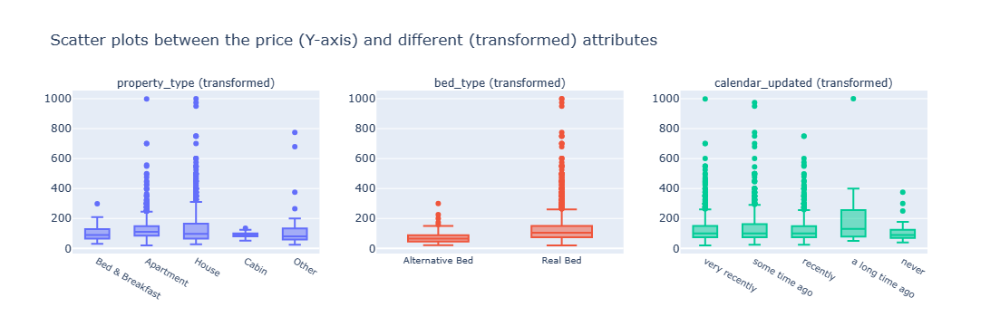

In [34]:
# plot boxplots for promising categorical attributes after category reducing
attributes = ['property_type', 'bed_type', 'calendar_updated']
reduced_data = rdcr.reduce(df_train.loc[:, attributes])

# transformed_categories = rdcr_transformer.fit_transform(df_train.loc[:, attributes])
fig = make_subplots(rows=1, cols=3, subplot_titles=[f'{attr} (transformed)' for attr in attributes])
fig.add_traces([{'x': reduced_data[attr],
                 'y': df_train['price'],
                 'showlegend': False,
                 # 'mode': 'markers',
                 'type': 'box'} for attr in attributes],
              rows=[1, 1, 1],
              cols=[1, 2, 3])
fig.update_layout({'title': 'Scatter plots between the price (Y-axis) and different (transformed) attributes'})
fig.update_annotations({'font': {'size': 12}})
fig.update_xaxes({'tickfont': {'size': 10}})
fig.show()

**Note**: We're happy with the category reduction done for these three attributes; the new boxplots still show differences in price medians and distributions between the new categories in each of these attributes.

We've highlighted 10 attributes as promising categorical features for Machine Learning. However, selecting all of them would lead to a high number of dummy variables. Given that the *neighbourhood_cleansed*, *neighbourhood_group_cleansed* and *zipcode* attributes essentially give the same information, we choose to keep the *neighbourhood_group_cleansed* attribute only as it encompasses the other two (it also has the lowest number of categories out of the three attributes).

#### Step 4 - Prepare the data for Machine Learning Algorithms

In this section, we will create the necessary pipelines to prepare the data for ML algorithms. 
But first, let's create new clean copies of the training and test sets and separate the features from the labels.

In [35]:
# create clean copy for the training set
train_features = train_set.drop(columns=['price'])
train_labels = train_set.loc[:, 'price'].copy()
# create clean copy for the test set
test_features = test_set.drop(columns=['price'])
test_labels = test_set.loc[:, 'price'].copy()

In [36]:
# list the numerical and categorical features selected during Step 3 - Explore the data
num_features = ['accommodates', 'bedrooms', 'beds', 'bathrooms', 'guests_included']
cat_features = ['room_type', 'neighbourhood_group_cleansed', 'property_type', 'bed_type', 'calendar_updated', 'host_response_time',
                'host_has_profile_pic', 'cancellation_policy', 'require_guest_profile_picture', 'require_guest_phone_verification']

- **Handle missing values**

1. For numerical features

During our exploration of the data, we notice that the following numerical attributes have missing values: 

- bedrooms
- beds
- bathrooms

Let's create an imputer for completing these missing values using the median along each column

In [37]:
# impute missing values with the mean value along each column
num_imputer = SimpleImputer(strategy='mean')

2. For categorical features

During our exploration of the data, we noticed that the *property_type* attribute has missing values. Let's create an imputer for completing these missing values using the mode along each column.

In [38]:
# impute missing values with the mode value along each column
cat_imputer = SimpleImputer(strategy='most_frequent')

- **Feature scaling**

The feature scaling will be applied to the numerical variables only. 

In [39]:
# create scaler
num_scaler = StandardScaler()

- **One-Hot Encoding**

A One-Hot encoder will be used to create dummy variables for our categorical ones.

In [40]:
cat_encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

Some of our categorical features are binary (i.e. True or False). Rather than using `cat_encoder` to transform them into numerical features, we will create our own function; it will simply replace True with 1 and False with 0.

In [41]:
def cat_to_num(df: pd.DataFrame):
    """Transform categorical features to numerical features.

    Args:
        df (pd.DataFrame): Categorical features to transform into numerical features.

    Returns: 
        (pd.DataFrame): Transformed features.

    """
    df_transformed = df.map(lambda x: 1 if x=='t' else 0)
    return df_transformed

In [42]:
# check the function works as expected
cat_to_num(train_features[['host_has_profile_pic', 'require_guest_profile_picture', 'require_guest_phone_verification']]).head()

,host_has_profile_pic,require_guest_profile_picture,require_guest_phone_verification
1182,1,0,0
1320,1,1,1
3102,1,0,0
2651,1,0,1
1207,1,0,0


---

- **Putting it all together: the preprocessing pipeline**

In [43]:
# step 1 - imputing missing values
ct_imputing = ColumnTransformer(
    [('num_imputer', num_imputer, num_features),
     ('cat_imputer', cat_imputer, cat_features)],
    remainder='drop',
    verbose_feature_names_out=False
)
ct_imputing.set_output(transform='pandas')

ColumnTransformer(transformers=[('num_imputer', SimpleImputer(),
                                 ['accommodates', 'bedrooms', 'beds',
                                  'bathrooms', 'guests_included']),
                                ('cat_imputer',
                                 SimpleImputer(strategy='most_frequent'),
                                 ['room_type', 'neighbourhood_group_cleansed',
                                  'property_type', 'bed_type',
                                  'calendar_updated', 'host_response_time',
                                  'host_has_profile_pic', 'cancellation_policy',
                                  'require_guest_profile_picture',
                                  'require_guest_phone_verification'])],
                  verbose_feature_names_out=False)

In [44]:
# step 2 - transforming some of the features only
ct_transforming = ColumnTransformer(
    [('num_scaler', num_scaler, num_features),
     ('cat_reducer', FunctionTransformer(func=rdcr.reduce, feature_names_out='one-to-one'), ['property_type', 'bed_type', 'calendar_updated'])],
    remainder='passthrough',
    verbose_feature_names_out=False
)
ct_transforming.set_output(transform='pandas')

ColumnTransformer(remainder='passthrough',
                  transformers=[('num_scaler', StandardScaler(),
                                 ['accommodates', 'bedrooms', 'beds',
                                  'bathrooms', 'guests_included']),
                                ('cat_reducer',
                                 FunctionTransformer(feature_names_out='one-to-one',
                                                     func=<bound method Reducer.reduce of <__main__.Reducer object at 0x000001E6ADC9A180>>),
                                 ['property_type', 'bed_type',
                                  'calendar_updated'])],
                  verbose_feature_names_out=False)

In [45]:
# step 3 - encoding categorical features
ct_encoding = ColumnTransformer(
    [('cat_encoder', cat_encoder, ['room_type', 'neighbourhood_group_cleansed', 'property_type', 'bed_type', 'calendar_updated', 'host_response_time', 'cancellation_policy']),
     ('cat_to_num', FunctionTransformer(func=cat_to_num, feature_names_out='one-to-one'), ['host_has_profile_pic', 'require_guest_profile_picture', 'require_guest_phone_verification'])],
    remainder='passthrough',
    verbose_feature_names_out=False
)
ct_encoding.set_output(transform='pandas')

ColumnTransformer(remainder='passthrough',
                  transformers=[('cat_encoder',
                                 OneHotEncoder(handle_unknown='ignore',
                                               sparse_output=False),
                                 ['room_type', 'neighbourhood_group_cleansed',
                                  'property_type', 'bed_type',
                                  'calendar_updated', 'host_response_time',
                                  'cancellation_policy']),
                                ('cat_to_num',
                                 FunctionTransformer(feature_names_out='one-to-one',
                                                     func=<function cat_to_num at 0x000001E6ACFE25C0>),
                                 ['host_has_profile_pic',
                                  'require_guest_profile_picture',
                                  'require_guest_phone_verification'])],
                  verbose_feature_names_out=False)

In [46]:
# putting it all together: the preprocessing pipeline
preprocessing = Pipeline(
    [('step1', ct_imputing),
     ('step2', ct_transforming),
     ('step3', ct_encoding)]
)

In [47]:
# check the preprocessing pipeline works as expected
preprocessing.fit_transform(train_features).head()

,room_type_Entire home/apt,room_type_Private room,room_type_Shared room,neighbourhood_group_cleansed_Ballard,neighbourhood_group_cleansed_Beacon Hill,neighbourhood_group_cleansed_Capitol Hill,neighbourhood_group_cleansed_Cascade,neighbourhood_group_cleansed_Central Area,neighbourhood_group_cleansed_Delridge,neighbourhood_group_cleansed_Downtown,neighbourhood_group_cleansed_Interbay,neighbourhood_group_cleansed_Lake City,neighbourhood_group_cleansed_Magnolia,neighbourhood_group_cleansed_Northgate,neighbourhood_group_cleansed_Other neighborhoods,neighbourhood_group_cleansed_Queen Anne,neighbourhood_group_cleansed_Rainier Valley,neighbourhood_group_cleansed_Seward Park,neighbourhood_group_cleansed_University District,neighbourhood_group_cleansed_West Seattle,property_type_Apartment,property_type_Bed & Breakfast,property_type_Cabin,property_type_House,property_type_Other,bed_type_Alternative Bed,bed_type_Real Bed,calendar_updated_a long time ago,calendar_updated_never,calendar_updated_recently,calendar_updated_some time ago,calendar_updated_very recently,host_response_time_a few days or more,host_response_time_within a day,host_response_time_within a few hours,host_response_time_within an hour,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,host_has_profile_pic,require_guest_profile_picture,require_guest_phone_verification,accommodates,bedrooms,beds,bathrooms,guests_included
1182,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1,0,0,-1.191869,-0.347390,-0.646371,-0.439915,-0.520724
1320,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1,1,1,0.319118,-0.347390,0.216871,-0.439915,-0.520724
3102,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1,0,0,-0.688207,-0.347390,0.216871,-0.439915,0.249020
2651,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1,0,1,0.319118,0.776562,0.216871,1.237004,-0.520724
1207,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1,0,0,-0.184544,-0.347390,-0.646371,-0.439915,0.249020


#### Step 5 - Select and train a model

- **Random Forest Regressor**

The model chosen is a Random Forest Regressor. We will fit the model on the train set, and evaluate its Root Mean Squared Error (RMSE) on the train set.

In [48]:
# create TransformedTargetRegressor
rfr = TransformedTargetRegressor(regressor=RandomForestRegressor(n_estimators=200, bootstrap=True, max_features='log2'),
                                 func=np.log10,
                                 inverse_func=sp.special.exp10)

In [49]:
# create full pipeline
full_pipeline = Pipeline(
    [('preprocessing', preprocessing),
     ('rfr', rfr)]
)

In [50]:
# fit the pipeline on the train set
full_pipeline.fit(train_features, train_labels)

Pipeline(steps=[('preprocessing',
                 Pipeline(steps=[('step1',
                                  ColumnTransformer(transformers=[('num_imputer',
                                                                   SimpleImputer(),
                                                                   ['accommodates',
                                                                    'bedrooms',
                                                                    'beds',
                                                                    'bathrooms',
                                                                    'guests_included']),
                                                                  ('cat_imputer',
                                                                   SimpleImputer(strategy='most_frequent'),
                                                                   ['room_type',
                                                                    'neighbourhood_group_cleansed',
                                                                    'property_type',
                                                                    'bed_type',
                                                                    'calendar_updated',
                                                                    'host_response_tim...
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function cat_to_num at 0x000001E6ACFE25C0>),
                                                                   ['host_has_profile_pic',
                                                                    'require_guest_profile_picture',
                                                                    'require_guest_phone_verification'])],
                                                    verbose_feature_names_out=False))])),
                ('rfr',
                 TransformedTargetRegressor(func=<ufunc 'log10'>,
                                            inverse_func=<ufunc 'exp10'>,
                                            regressor=RandomForestRegressor(max_features='log2',
                                                                            n_estimators=200)))])

In [51]:
# measure the model's Root Means Squared Error (RMSE) on the training data
pred = full_pipeline.predict(train_features)
rmse = root_mean_squared_error(train_labels, pred)
print(f"The model's RMSE is: {rmse}")

The model's RMSE is: 29.29563453032281


**Note**: During our exploration of the train set, we saw that most prices range between 20 and 200 USD; so a typical error of 29.33 USD doesn't seem unreasonable.  

In [52]:
# apply cross validation on the train set
scores = cross_val_score(full_pipeline, train_features, train_labels, scoring='neg_mean_squared_error', cv=5)
rmse_scores = np.sqrt(-scores)

In [53]:
print(f"The RMSE scores: {rmse_scores}\nThe mean: {rmse_scores.mean()}\nThe standard deviation: {rmse_scores.std()}")

The RMSE scores: [51.91274919 51.77464055 62.59724544 70.76699986 60.04444152]
The mean: 59.41921531194779
The standard deviation: 7.128107104518443


**Note**: We notice that the RMSE score on the train set is much lower than on the validation sets, meaning that our model is currently overfitting the train set. 

In [54]:
# feature importances
y = full_pipeline['rfr'].regressor_.feature_importances_ # the feature importance values
x = full_pipeline['preprocessing'].get_feature_names_out() # the names of the associated features
# store feature importances in DataFrame object
importances = pd.DataFrame([(xi, yi) for xi, yi in zip(x, y)])
importances.sort_values(by=1, ascending=False, inplace=True)
importances.head()

,0,1
42,accommodates,0.134958
0,room_type_Entire home/apt,0.121845
43,bedrooms,0.119638
45,bathrooms,0.084366
44,beds,0.079136


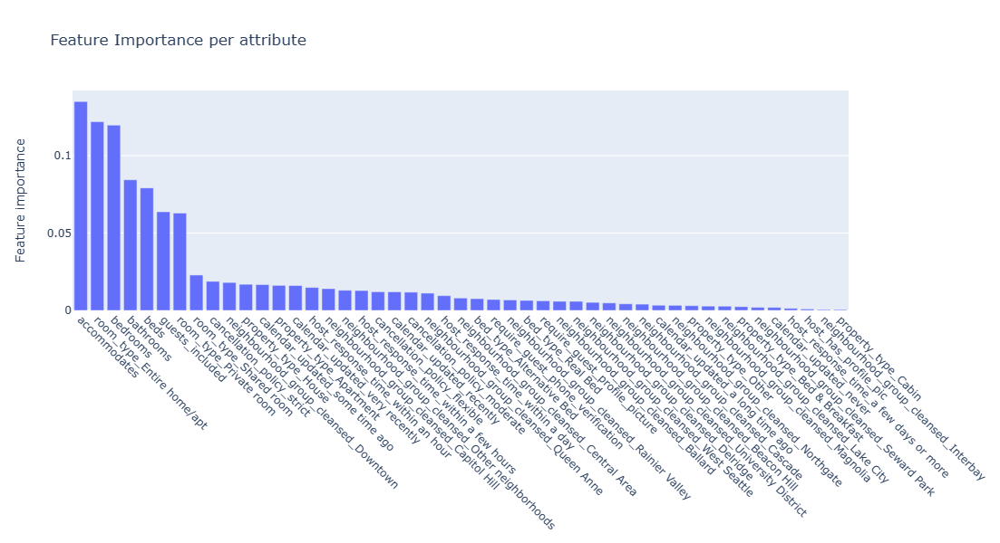

In [55]:
# plot the feature importances
fig = go.Figure()
fig.add_trace({'x': importances[0],
               'y': importances[1],
               'type': 'bar'})
fig.update_layout({'title': 'Feature Importance per attribute', 'height': 600})
fig.update_xaxes({'tickangle': 45})
fig.update_yaxes({'title': 'Feature importance'})
fig.show()

**Note**: This plot shows that it might be worth removing some of the features.

Finally, let's try our model on the test data.

In [56]:
predictions = full_pipeline.predict(test_features)
rmse_predictions = root_mean_squared_error(test_labels, predictions)

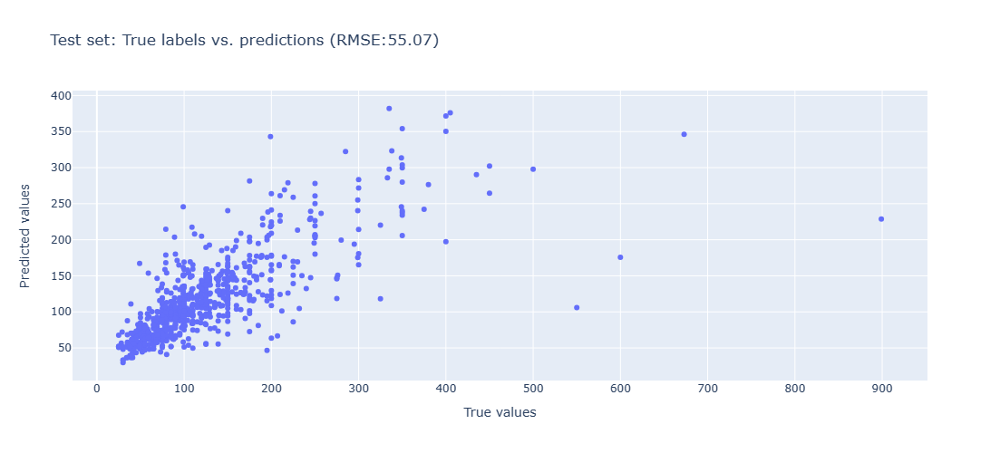

In [57]:
# plot true labels versus predictions
fig = go.Figure()
fig.add_trace({'x': test_labels.to_numpy(),
               'y': predictions,
               'mode': 'markers',
               'type': 'scatter'})
fig.add_trace({})
fig.update_layout({'title': f'Test set: True labels vs. predictions (RMSE:{round(rmse_predictions, 2)})',
                   'height': 500, 'width': 600})
fig.update_xaxes({'title': 'True values'})
fig.update_yaxes({'title': 'Predicted values'})
fig.show()

In [58]:
# # Host plot on Plotly Chart Studio
# py.plot(fig, filename='predictions')

**Observation**: The plot generally shows a linear trend. We can see that our model shows difficulty in predicting prices for listings whose true price is high.

**Answer to Question 3 - Is it possible to predict the nightly price of a listing**: 

The short answer is yes; the model we built shows satisfying results. 
However, there is still room for improvement. This would be beyond the scope of this question, but it would be interesting to do the following:

- fine-tuning the model by changing its hyperparameters
- experiment with attribute combinations to potentially create more useful new attributes
- drop some of the less useful features according ot the feature importance values we earlier displayed

---
---

**THE END.**